In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=all, 1=info, 2=warning, 3=error
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
! python --version

Python 3.9.23


In [ ]:
import tensorflow as tf

# In phiên bản TensorFlow
print("TensorFlow version:", tf.__version__)

# Liệt kê GPU mà TensorFlow nhận được
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPU devices found:")
    for gpu in gpus:
        print("  ", gpu)
else:
    print("No GPU found. TensorFlow is running on CPU.")

# Kiểm tra xem TensorFlow có thể sử dụng GPU không
print("Is TensorFlow built with GPU support:", tf.test.is_built_with_cuda())
print("Is GPU available for TensorFlow:", tf.test.is_gpu_available())


TensorFlow version: 2.10.1
GPU devices found:
   PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
Is TensorFlow built with GPU support: True
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
Is GPU available for TensorFlow: True


# Tải Data

In [ ]:
! nvidia-smi

Tue Sep 16 08:02:49 2025       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 527.41       Driver Version: 527.41       CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GRID P40-24Q       WDDM  | 00000000:02:01.0 Off |                  N/A |
| N/A    0C    P0    N/A /  N/A |    623MiB / 24576MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install datasets

In [ ]:
from datasets import load_dataset

ds = load_dataset(
    "mertcobanov/nature-dataset",
    split="train",
    cache_dir="C:/temp/hf_datasets"
)


Generating train split:   0%|          | 0/50000 [00:00<?, ? examples/s]

# Tạo Data

In [ ]:
import numpy as np

In [ ]:
ds

Dataset({
    features: ['image', 'caption'],
    num_rows: 50000
})

In [ ]:
! pip install matplotlib

   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------------------------------------- 7.8/7.8 MB 44.0 MB/s  0:00:00
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 1.5/1.5 MB 79.4 MB/s  0:00:00

   ---------------------------------------- 0/7 [pyparsing]
   ----------------- ---------------------- 3/7 [fonttools]
   ----------------- ---------------------- 3/7 [fonttools]
   ----------------- ---------------------- 3/7 [fonttools]
   ----------------- ---------------------- 3/7 [fonttools]
   ----------------- ---------------------- 3/7 [fonttools]
   ----------------- ---------------------- 3/7 [fonttools]
   ----------------- ---------------------- 3/7 [fonttools]
   ----------------- ---------------------- 3/7 [fonttools]
   ----------------- ---------------------- 3/7 [fonttools]
   ---------------------------------- ----- 6/7 [matplotlib]
   ---------------------------------- ----- 6/7 [mat

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

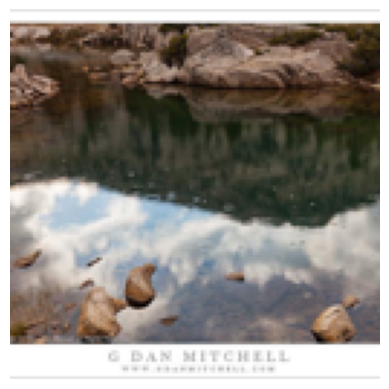

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

img = ds[0]["image"].resize((128,128))  # PIL.Image
plt.imshow(np.array(img))
plt.axis('off')
plt.show()


In [ ]:
from tqdm.notebook import tqdm
import numpy as np
target_size = (128, 128)
images = np.array([np.array(img.resize(target_size)) for img in tqdm(ds["image"], desc="Resizing images")])
print("Shape:", images.shape)

Resizing images:   0%|          | 0/50000 [00:00<?, ?it/s]

Shape: (50000, 128, 128, 3)


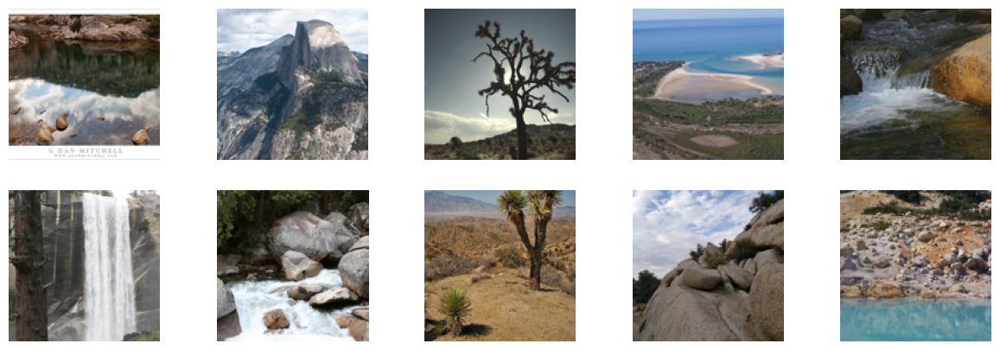

In [ ]:
# Hiển thị 10 ảnh đầu tiên
plt.figure(figsize=(15, 5))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(images[i])
    plt.axis('off')
plt.show()

In [ ]:
images.shape

(50000, 128, 128, 3)

- Tiền xử lí ảnh

In [ ]:
images[1].shape

(128, 128, 3)

In [ ]:
images_array = images.astype('float32') / 127.5 - 1.0

In [ ]:
np.save("images_array_Norm.npy", images_array)

In [ ]:
images_array.shape

(50000, 128, 128, 3)

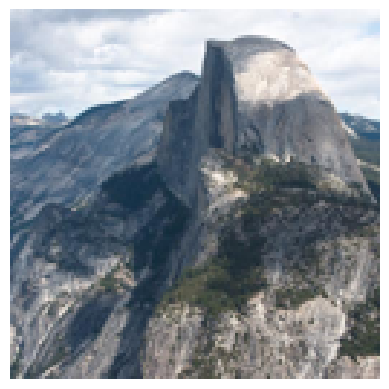

In [ ]:
import matplotlib.pyplot as plt
plt.imshow((images_array[1]+1)/2, interpolation="nearest")
plt.axis("off")
plt.show()

- Chia dữ liệu

In [ ]:
import numpy as np
images = np.load("images_array_Norm.npy")

In [ ]:
print(images[0].min(),images[0].max())

-1.0 1.0


In [ ]:
! pip install scikit-learn

   ---------------------------------------- 0.0/11.2 MB ? eta -:--:--
   --------------- ------------------------ 4.5/11.2 MB 24.4 MB/s eta 0:00:01
   ---------------------------------------- 11.2/11.2 MB 30.3 MB/s  0:00:00
   ---------------------------------------- 0.0/46.2 MB ? eta -:--:--
   ------------ --------------------------- 14.9/46.2 MB 78.5 MB/s eta 0:00:01
   --------------- ------------------------ 18.4/46.2 MB 46.4 MB/s eta 0:00:01
   ------------------- -------------------- 23.1/46.2 MB 39.5 MB/s eta 0:00:01
   ---------------------------- ----------- 32.5/46.2 MB 40.5 MB/s eta 0:00:01
   -------------------------------- ------- 37.7/46.2 MB 38.1 MB/s eta 0:00:01
   ------------------------------------ --- 41.9/46.2 MB 34.6 MB/s eta 0:00:01
   ---------------------------------------  46.1/46.2 MB 35.0 MB/s eta 0:00:01
   ---------------------------------------- 46.2/46.2 MB 30.3 MB/s  0:00:01

   ---------- ----------------------------- 1/4 [scipy]
   ---------- ------

In [ ]:
import numpy as np
import random
import tensorflow as tf
from sklearn.model_selection import train_test_split

In [ ]:
seed = 42
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
import numpy as np
import random
import tensorflow as tf
from sklearn.model_selection import train_test_split

# ---- Set random seed 42 ----
seed = 42
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)

# ---- Split data ----
X_train, X_test = train_test_split(
    images, test_size=0.2, random_state=seed, shuffle=True
)

print("Train:", X_train.shape)
print("Test: ", X_test.shape)

Train: (40000, 128, 128, 3)
Test:  (10000, 128, 128, 3)


In [ ]:
np.savez("dataset.npz",
         X_train=X_train,
         X_test=X_test)

In [ ]:
import numpy as np

# Load dataset
data = np.load("dataset.npz")

# Lấy từng tập ra
X_train = data["X_train"]
X_test  = data["X_test"]

print("Train:", X_train.shape)
print("Test: ", X_test.shape)


Train: (40000, 128, 128, 3)
Test:  (10000, 128, 128, 3)


In [ ]:
X_train[0].shape

(128, 128, 3)

In [ ]:
print(X_train[0].max(),X_train[0].min())

0.8745098 -1.0


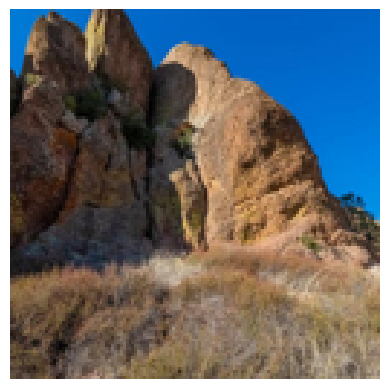

In [ ]:
plt.imshow((X_train[0]+1)/2, interpolation="nearest")
plt.axis("off")
plt.show()

# Xây dựng model

In [9]:
import numpy as np
import random
import tensorflow as tf
from sklearn.model_selection import train_test_split

# ---- Set random seed 42 ----
seed = 42
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)


img_shape = (128, 128, 3)
latent_dim = 128

In [ ]:
import tensorflow as tf

# Đặt memory growth ngay sau khi import
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

- GEN

In [10]:
import tensorflow as tf
from tensorflow.keras import layers

class GEN:
    def __init__(self):
        self.model = None

    def build_model(self):
        model = tf.keras.Sequential(name="Generator")
        # Project and reshape
        n_filters = 1024
        initial_size = 4  # start from 4x4
        model.add(layers.Input(shape=(latent_dim,)))
        model.add(layers.Dense(initial_size*initial_size*n_filters, use_bias=False))
        model.add(layers.Reshape((initial_size, initial_size, n_filters)))  # 4x4x1024
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # Upsample to 8x8
        model.add(layers.Conv2DTranspose(512, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # 16x16
        model.add(layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # 32x32
        model.add(layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # 64x64
        model.add(layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # 128x128
        model.add(layers.Conv2DTranspose(32, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        model.add(layers.Conv2D(3, kernel_size=7, padding="same", activation="tanh"))
        self.model = model


    def save(self, path):
        if self.model is not None:
            self.model.save_weights(path)
            print(f"Weights saved to {path}")
        else:
            print("No model to save!")

    def load_model(self, path):
        if self.model is not None:
            self.model.load_weights(path)
            print(f"Weights loaded from {path}")
        else:
            print("Build the model first before loading weights!")

    def summary(self):
        if self.model is not None:
            self.model.summary()
        else:
            print("Model is not built yet!")

    def train(self, X_train, y_train, X_val, y_val, epochs=30, batch_size=32):
        pass

    def predict(self, x):
        if self.model is None:
            print("Model is not built yet!")
            return None
        return self.model.predict(x)


In [ ]:
model_gen = GEN()

In [ ]:
model_gen.build_model()

In [ ]:
model_gen.summary()

Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             2097152   
                                                                 
 reshape (Reshape)           (None, 4, 4, 1024)        0         
                                                                 
 batch_normalization (BatchN  (None, 4, 4, 1024)       4096      
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 4, 4, 1024)        0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 512)        8388608   
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 512)        20

In [ ]:
model_gen.save("generator_model.h5")

Weights saved to generator_model.h5


In [ ]:
model_gen.load_model("generator_model.h5")

Weights loaded from generator_model.h5


- Discriminator

In [11]:
import tensorflow as tf

class Discriminator:
    def __init__(self):
        self.model = None

    def build_model(self):
        model = tf.keras.Sequential(name="Discriminator")
        model.add(layers.Input(shape=img_shape))

        model.add(layers.Conv2D(64, kernel_size=4, strides=2, padding="same"))
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Conv2D(128, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Conv2D(256, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Conv2D(512, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Conv2D(1024, kernel_size=4, strides=2, padding="same", use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Flatten())
        model.add(layers.Dense(1, activation="sigmoid"))
        self.model = model


    def save(self, path):
        if self.model is not None:
            self.model.save_weights(path)
            print(f"Weights saved to {path}")
        else:
            print("No model to save!")

    def load_model(self, path):
        if self.model is not None:
            self.model.load_weights(path)
            print(f"Weights loaded from {path}")
        else:
            print("Build the model first before loading weights!")

    def summary(self):
        if self.model is not None:
            self.model.summary()
        else:
            print("Model is not built yet!")

    def train(self, X_train, y_train, X_val, y_val, epochs=30, batch_size=32):
        pass

    def predict(self, x):
        if self.model is None:
            print("Model is not built yet!")
            return None
        return self.model.predict(x)


In [ ]:
model_dis = Discriminator()

In [ ]:
model_dis.build_model()

In [ ]:
model_dis.summary()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       131072    
                                                                 
 batch_normalization_6 (Batc  (None, 32, 32, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32, 32, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 256)       524288    
                                                     

In [ ]:
model_dis.save("discriminator_model.h5")

Weights saved to discriminator_model.h5


In [ ]:
model_dis.load_model("discriminator_model.h5")

Weights loaded from discriminator_model.h5


# kết hợp cả 2

In [ ]:
save_path = "Images"

In [ ]:
import os
os.makedirs(save_path, exist_ok=True)

In [ ]:
import matplotlib.pyplot as plt
noise = tf.random.normal([10, latent_dim])
def show_generated_image(generator, latent_dim, epoch, save_path="Models"):
    gen_imgs = generator.model(noise, training=False)

    gen_imgs = (gen_imgs + 1) / 2.0

    plt.figure(figsize=(15, 6))
    for i in range(10):
        plt.subplot(2, 5, i+1)
        plt.imshow(gen_imgs[i].numpy())
        plt.axis("off")
    filename = f"{save_path}/generated_epoch_{epoch}.png"
    plt.savefig(filename, bbox_inches="tight", pad_inches=0)
    plt.show()
    print(f"[+] Saved {filename}")

In [ ]:
import tensorflow as tf
import numpy as np
from tqdm import tqdm

class DCGANTrainer:
    def __init__(self, gen, disc, latent_dim):
        self.gen = gen
        self.disc = disc
        self.latent_dim = latent_dim

        self.gen_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        self.disc_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        self.bce = tf.keras.losses.BinaryCrossentropy(from_logits=False)

    @tf.function
    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal([batch_size, self.latent_dim])

        # === Train Discriminator ===
        with tf.GradientTape() as disc_tape:
            fake_images = self.gen.model(noise, training=True)

            real_output = self.disc.model(real_images, training=True)
            fake_output = self.disc.model(fake_images, training=True)

            disc_loss_real = self.bce(tf.ones_like(real_output), real_output)
            disc_loss_fake = self.bce(tf.zeros_like(fake_output), fake_output)
            disc_loss = disc_loss_real + disc_loss_fake

        grads_disc = disc_tape.gradient(disc_loss, self.disc.model.trainable_variables)
        self.disc_optimizer.apply_gradients(zip(grads_disc, self.disc.model.trainable_variables))

        # === Train Generator ===
        noise = tf.random.normal([batch_size, self.latent_dim])
        with tf.GradientTape() as gen_tape:
            fake_images = self.gen.model(noise, training=True)
            fake_output = self.disc.model(fake_images, training=True)
            gen_loss = self.bce(tf.ones_like(fake_output), fake_output)

        grads_gen = gen_tape.gradient(gen_loss, self.gen.model.trainable_variables)
        self.gen_optimizer.apply_gradients(zip(grads_gen, self.gen.model.trainable_variables))

        return disc_loss, gen_loss

    def train(self, dataset, epochs=50):
        history = {"disc_loss": [], "gen_loss": []}

        for epoch in range(epochs):
            d_loss_epoch = []
            g_loss_epoch = []

            for real_images in tqdm(dataset, desc=f"Epoch {epoch+1}/{epochs}"):
                d_loss, g_loss = self.train_step(real_images)
                d_loss_epoch.append(d_loss.numpy())
                g_loss_epoch.append(g_loss.numpy())

            d_loss_mean = np.mean(d_loss_epoch)
            g_loss_mean = np.mean(g_loss_epoch)

            history["disc_loss"].append(d_loss_mean)
            history["gen_loss"].append(g_loss_mean)
            print(f"Epoch {epoch+1}/{epochs} - D_loss: {d_loss_mean:.4f}, G_loss: {g_loss_mean:.4f}")
            if (epoch+1) == 1:
                np.savez("history/history.npz", **history)
                show_generated_image(self.gen, self.latent_dim, epoch=epoch+1)
                self.gen.save(f"Models/generator_model_{epoch+1}.h5")
                self.disc.save(f"Models/discriminator_model_{epoch+1}.h5")
            if (epoch+1) % 10 == 0:
                np.savez("history/history.npz", **history)
                show_generated_image(self.gen, self.latent_dim, epoch=epoch+1)
                self.gen.save(f"Models/generator_model_{epoch+1}.h5")
                self.disc.save(f"Models/discriminator_model_{epoch+1}.h5")

        return history


- Train

In [ ]:
import os
import warnings
import sys

# 1️⃣ Tắt TensorFlow logging (info, warning)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=all, 1=info, 2=warning, 3=error

# 2️⃣ Tắt Python warnings (DeprecationWarning, UserWarning,…)
warnings.filterwarnings('ignore')

In [ ]:
model_gen = GEN()
model_dis = Discriminator()
model_gen.build_model()
model_dis.build_model()
trainer = DCGANTrainer(model_gen, model_dis,latent_dim)

In [ ]:
import tensorflow as tf
import numpy as np

# ==== Load dataset ====
data = np.load("dataset.npz")
X_train = data["X_train"]
X_test   = data["X_test"]

In [ ]:
print("Train:", X_train.shape)
print("Test:", X_test.shape)

Train: (40000, 128, 128, 3)
Test: (10000, 128, 128, 3)


In [ ]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000

train_dataset = (
    tf.data.Dataset.from_tensor_slices(X_train)
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

test_dataset = (
    tf.data.Dataset.from_tensor_slices(X_test)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

In [ ]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


Epoch 1/100: 100%|█████████████████| 1250/1250 [04:19<00:00,  4.82it/s]


Epoch 1/100 - D_loss: 0.9735, G_loss: 4.5750


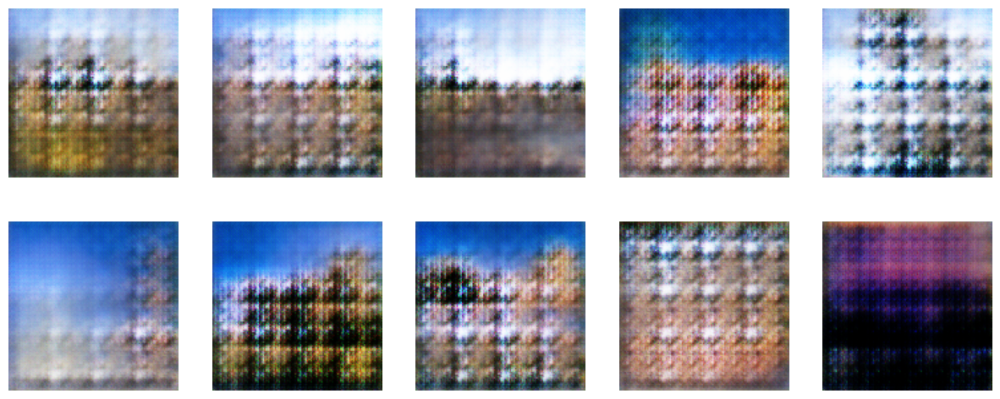

[+] Saved Models/generated_epoch_1.png
Weights saved to Models/generator_model_1.h5
Weights saved to Models/discriminator_model_1.h5


Epoch 2/100: 100%|█████████████████| 1250/1250 [04:14<00:00,  4.90it/s]


Epoch 2/100 - D_loss: 0.9010, G_loss: 3.4958


Epoch 3/100: 100%|█████████████████| 1250/1250 [04:14<00:00,  4.92it/s]


Epoch 3/100 - D_loss: 0.7788, G_loss: 3.7230


Epoch 4/100: 100%|█████████████████| 1250/1250 [04:15<00:00,  4.90it/s]


Epoch 4/100 - D_loss: 0.7889, G_loss: 3.4996


Epoch 5/100: 100%|█████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 5/100 - D_loss: 0.7674, G_loss: 3.3805


Epoch 6/100: 100%|█████████████████| 1250/1250 [04:15<00:00,  4.88it/s]


Epoch 6/100 - D_loss: 0.7363, G_loss: 3.2966


Epoch 7/100: 100%|█████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 7/100 - D_loss: 0.6972, G_loss: 3.3407


Epoch 8/100: 100%|█████████████████| 1250/1250 [04:15<00:00,  4.88it/s]


Epoch 8/100 - D_loss: 0.6695, G_loss: 3.3983


Epoch 9/100: 100%|█████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 9/100 - D_loss: 0.6612, G_loss: 3.3791


Epoch 10/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 10/100 - D_loss: 0.6235, G_loss: 3.3837


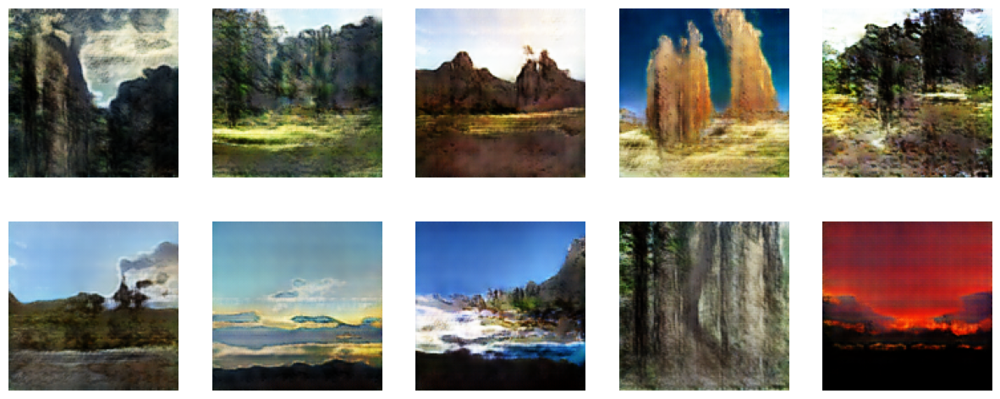

[+] Saved Models/generated_epoch_10.png
Weights saved to Models/generator_model_10.h5
Weights saved to Models/discriminator_model_10.h5


Epoch 11/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 11/100 - D_loss: 0.6243, G_loss: 3.3157


Epoch 12/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 12/100 - D_loss: 0.5996, G_loss: 3.3950


Epoch 13/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 13/100 - D_loss: 0.5800, G_loss: 3.3926


Epoch 14/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.88it/s]


Epoch 14/100 - D_loss: 0.5923, G_loss: 3.4199


Epoch 15/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.88it/s]


Epoch 15/100 - D_loss: 0.5448, G_loss: 3.5186


Epoch 16/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.88it/s]


Epoch 16/100 - D_loss: 0.5061, G_loss: 3.6223


Epoch 17/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.88it/s]


Epoch 17/100 - D_loss: 0.4829, G_loss: 3.7975


Epoch 18/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 18/100 - D_loss: 0.4652, G_loss: 3.8233


Epoch 19/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.88it/s]


Epoch 19/100 - D_loss: 0.4627, G_loss: 3.8648


Epoch 20/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 20/100 - D_loss: 0.4580, G_loss: 3.8606


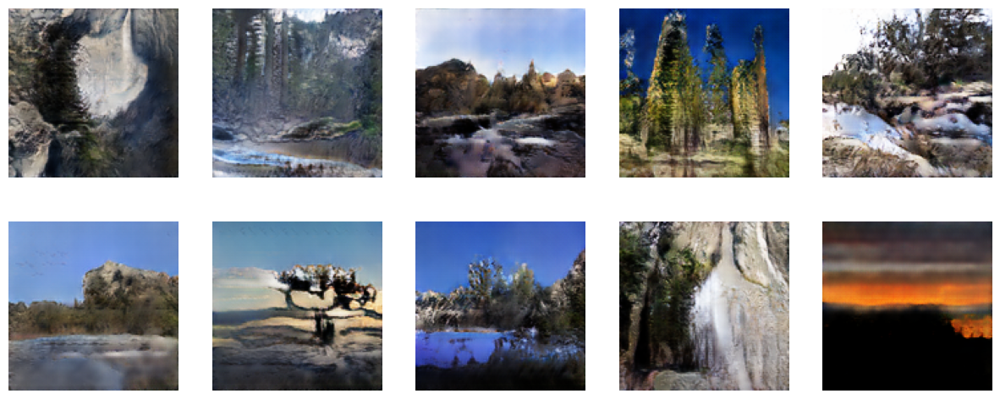

[+] Saved Models/generated_epoch_20.png
Weights saved to Models/generator_model_20.h5
Weights saved to Models/discriminator_model_20.h5


Epoch 21/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 21/100 - D_loss: 0.4169, G_loss: 3.9492


Epoch 22/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.89it/s]


Epoch 22/100 - D_loss: 0.4157, G_loss: 4.0452


Epoch 23/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 23/100 - D_loss: 0.4081, G_loss: 4.2343


Epoch 24/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 24/100 - D_loss: 0.3581, G_loss: 4.2146


Epoch 25/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 25/100 - D_loss: 0.3776, G_loss: 4.3363


Epoch 26/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 26/100 - D_loss: 0.3472, G_loss: 4.4662


Epoch 27/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 27/100 - D_loss: 0.3296, G_loss: 4.4540


Epoch 28/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 28/100 - D_loss: 0.3483, G_loss: 4.5314


Epoch 29/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 29/100 - D_loss: 0.3343, G_loss: 4.5870


Epoch 30/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 30/100 - D_loss: 0.2916, G_loss: 4.6916


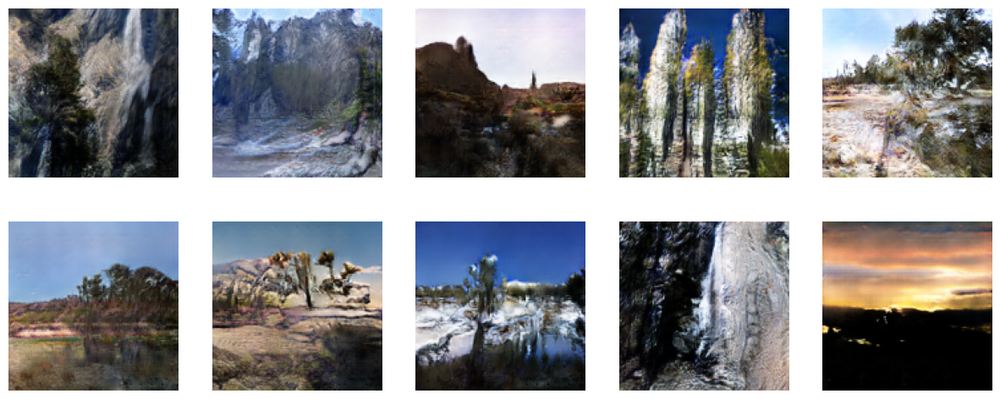

[+] Saved Models/generated_epoch_30.png
Weights saved to Models/generator_model_30.h5
Weights saved to Models/discriminator_model_30.h5


Epoch 31/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 31/100 - D_loss: 0.3041, G_loss: 4.8203


Epoch 32/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 32/100 - D_loss: 0.3068, G_loss: 4.7821


Epoch 33/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 33/100 - D_loss: 0.2887, G_loss: 4.9821


Epoch 34/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 34/100 - D_loss: 0.2761, G_loss: 5.0490


Epoch 35/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 35/100 - D_loss: 0.2592, G_loss: 5.0925


Epoch 36/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 36/100 - D_loss: 0.2693, G_loss: 5.2458


Epoch 37/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 37/100 - D_loss: 0.2571, G_loss: 5.2113


Epoch 38/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 38/100 - D_loss: 0.2402, G_loss: 5.3719


Epoch 39/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 39/100 - D_loss: 0.2322, G_loss: 5.4173


Epoch 40/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 40/100 - D_loss: 0.2500, G_loss: 5.4085


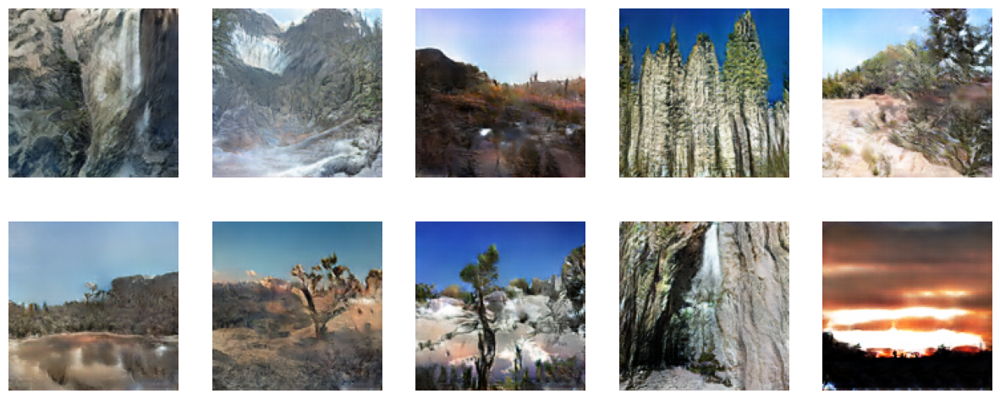

[+] Saved Models/generated_epoch_40.png
Weights saved to Models/generator_model_40.h5
Weights saved to Models/discriminator_model_40.h5


Epoch 41/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.95it/s]


Epoch 41/100 - D_loss: 0.2514, G_loss: 5.3248


Epoch 42/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 42/100 - D_loss: 0.2121, G_loss: 5.4442


Epoch 43/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 43/100 - D_loss: 0.2389, G_loss: 5.4249


Epoch 44/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 44/100 - D_loss: 0.2541, G_loss: 5.4722


Epoch 45/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 45/100 - D_loss: 0.1923, G_loss: 5.5210


Epoch 46/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.92it/s]


Epoch 46/100 - D_loss: 0.2212, G_loss: 5.6516


Epoch 47/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.92it/s]


Epoch 47/100 - D_loss: 0.2444, G_loss: 5.7818


Epoch 48/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.92it/s]


Epoch 48/100 - D_loss: 0.1535, G_loss: 5.6706


Epoch 49/100: 100%|████████████████| 1250/1250 [04:14<00:00,  4.92it/s]


Epoch 49/100 - D_loss: 0.2487, G_loss: 5.6662


Epoch 50/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.92it/s]


Epoch 50/100 - D_loss: 0.1820, G_loss: 5.9075


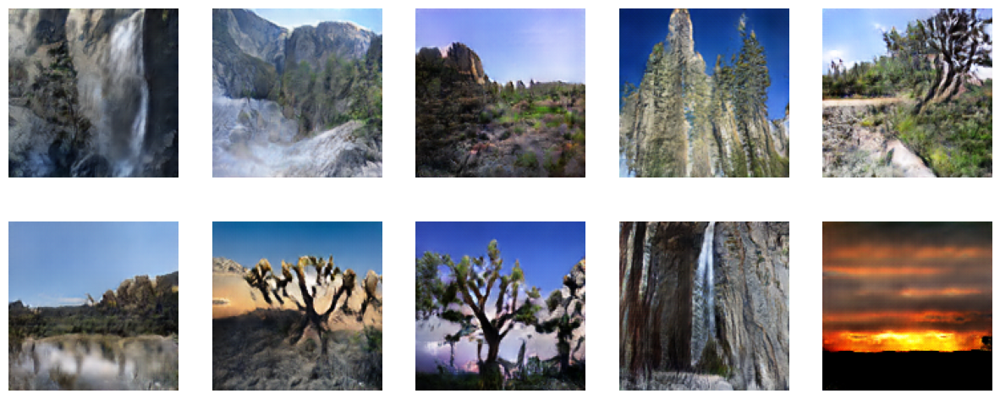

[+] Saved Models/generated_epoch_50.png
Weights saved to Models/generator_model_50.h5
Weights saved to Models/discriminator_model_50.h5


Epoch 51/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 51/100 - D_loss: 0.1906, G_loss: 5.8410


Epoch 52/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 52/100 - D_loss: 0.1997, G_loss: 6.0149


Epoch 53/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 53/100 - D_loss: 0.1795, G_loss: 6.0198


Epoch 54/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 54/100 - D_loss: 0.1973, G_loss: 6.0743


Epoch 55/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 55/100 - D_loss: 0.2049, G_loss: 5.8692


Epoch 56/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 56/100 - D_loss: 0.1717, G_loss: 6.1422


Epoch 57/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 57/100 - D_loss: 0.1481, G_loss: 6.2313


Epoch 58/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 58/100 - D_loss: 0.1667, G_loss: 6.3874


Epoch 59/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 59/100 - D_loss: 0.1455, G_loss: 6.3398


Epoch 60/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 60/100 - D_loss: 0.1766, G_loss: 6.4834


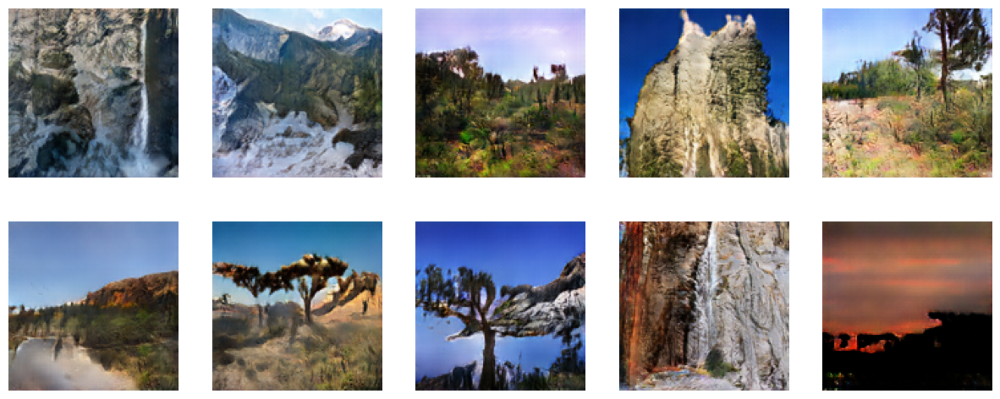

[+] Saved Models/generated_epoch_60.png
Weights saved to Models/generator_model_60.h5
Weights saved to Models/discriminator_model_60.h5


Epoch 61/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 61/100 - D_loss: 0.1452, G_loss: 6.4734


Epoch 62/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 62/100 - D_loss: 0.2108, G_loss: 6.4019


Epoch 63/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 63/100 - D_loss: 0.1624, G_loss: 6.4208


Epoch 64/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 64/100 - D_loss: 0.1381, G_loss: 6.5395


Epoch 65/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 65/100 - D_loss: 0.1695, G_loss: 6.5034


Epoch 66/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 66/100 - D_loss: 0.1286, G_loss: 6.8330


Epoch 67/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 67/100 - D_loss: 0.1611, G_loss: 6.5410


Epoch 68/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 68/100 - D_loss: 0.1154, G_loss: 6.8348


Epoch 69/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 69/100 - D_loss: 0.2157, G_loss: 6.5128


Epoch 70/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 70/100 - D_loss: 0.1478, G_loss: 6.7308


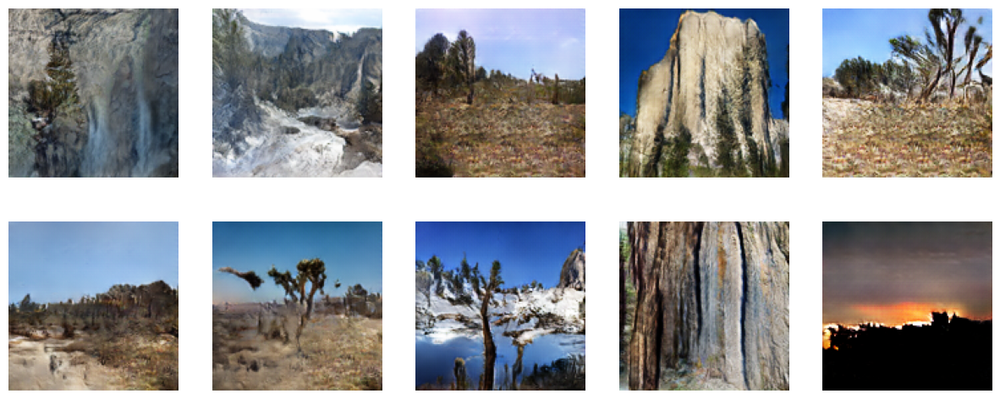

[+] Saved Models/generated_epoch_70.png
Weights saved to Models/generator_model_70.h5
Weights saved to Models/discriminator_model_70.h5


Epoch 71/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 71/100 - D_loss: 0.1511, G_loss: 6.8838


Epoch 72/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 72/100 - D_loss: 0.1475, G_loss: 6.6288


Epoch 73/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 73/100 - D_loss: 0.1672, G_loss: 6.7438


Epoch 74/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 74/100 - D_loss: 0.1149, G_loss: 6.8036


Epoch 75/100: 100%|████████████████| 1250/1250 [04:20<00:00,  4.80it/s]


Epoch 75/100 - D_loss: 0.1815, G_loss: 6.6951


Epoch 76/100: 100%|████████████████| 1250/1250 [04:14<00:00,  4.92it/s]


Epoch 76/100 - D_loss: 0.1185, G_loss: 6.8795


Epoch 77/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 77/100 - D_loss: 0.1509, G_loss: 7.1879


Epoch 78/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.93it/s]


Epoch 78/100 - D_loss: 0.1224, G_loss: 6.9371


Epoch 79/100: 100%|████████████████| 1250/1250 [04:13<00:00,  4.94it/s]


Epoch 79/100 - D_loss: 0.1299, G_loss: 7.0318


Epoch 80/100: 100%|████████████████| 1250/1250 [04:12<00:00,  4.94it/s]


Epoch 80/100 - D_loss: 0.1275, G_loss: 7.2047


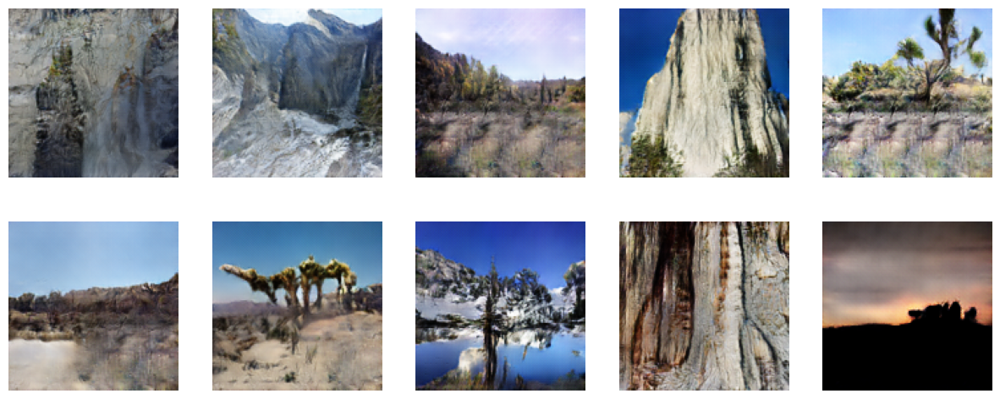

[+] Saved Models/generated_epoch_80.png
Weights saved to Models/generator_model_80.h5
Weights saved to Models/discriminator_model_80.h5


Epoch 81/100: 100%|████████████████| 1250/1250 [04:17<00:00,  4.85it/s]


Epoch 81/100 - D_loss: 0.1538, G_loss: 7.1932


Epoch 82/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 82/100 - D_loss: 0.1044, G_loss: 6.9755


Epoch 83/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 83/100 - D_loss: 0.1186, G_loss: 7.1732


Epoch 84/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 84/100 - D_loss: 0.1843, G_loss: 7.2295


Epoch 85/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 85/100 - D_loss: 0.1077, G_loss: 7.0450


Epoch 86/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.88it/s]


Epoch 86/100 - D_loss: 0.1258, G_loss: 7.2837


Epoch 87/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 87/100 - D_loss: 0.1329, G_loss: 7.1902


Epoch 88/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 88/100 - D_loss: 0.1272, G_loss: 7.3384


Epoch 89/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 89/100 - D_loss: 0.1532, G_loss: 7.0940


Epoch 90/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 90/100 - D_loss: 0.1005, G_loss: 7.1725


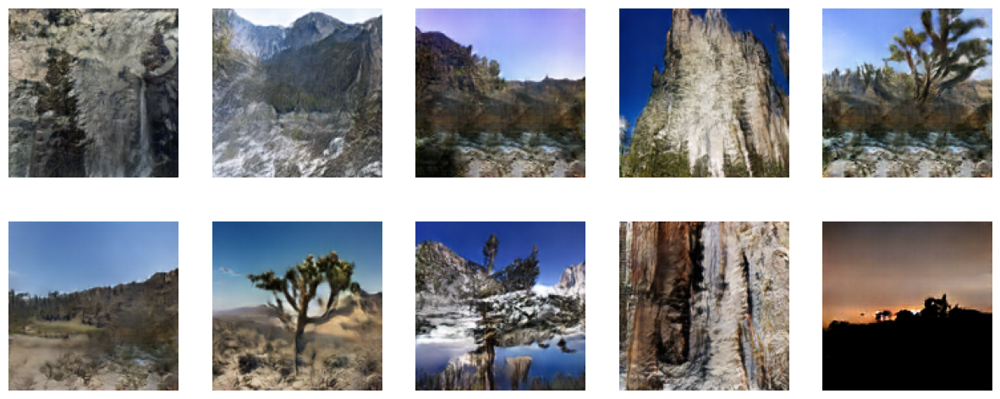

[+] Saved Models/generated_epoch_90.png
Weights saved to Models/generator_model_90.h5
Weights saved to Models/discriminator_model_90.h5


Epoch 91/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.88it/s]


Epoch 91/100 - D_loss: 0.1205, G_loss: 7.3137


Epoch 92/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.88it/s]


Epoch 92/100 - D_loss: 0.1173, G_loss: 7.3805


Epoch 93/100: 100%|████████████████| 1250/1250 [04:15<00:00,  4.88it/s]


Epoch 93/100 - D_loss: 0.1098, G_loss: 7.5172


Epoch 94/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 94/100 - D_loss: 0.1269, G_loss: 7.3167


Epoch 95/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 95/100 - D_loss: 0.1374, G_loss: 7.2903


Epoch 96/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 96/100 - D_loss: 0.0993, G_loss: 7.5136


Epoch 97/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.87it/s]


Epoch 97/100 - D_loss: 0.1277, G_loss: 7.5060


Epoch 98/100: 100%|████████████████| 1250/1250 [04:16<00:00,  4.86it/s]


Epoch 98/100 - D_loss: 0.1107, G_loss: 7.5614


Epoch 99/100: 100%|████████████████| 1250/1250 [04:19<00:00,  4.82it/s]


Epoch 99/100 - D_loss: 0.1231, G_loss: 7.6541


Epoch 100/100: 100%|███████████████| 1250/1250 [04:22<00:00,  4.77it/s]


Epoch 100/100 - D_loss: 0.1502, G_loss: 7.6310


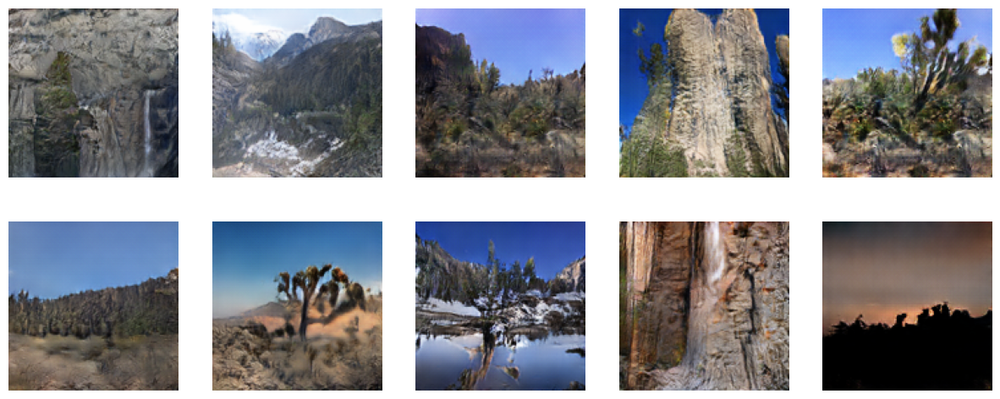

[+] Saved Models/generated_epoch_100.png
Weights saved to Models/generator_model_100.h5
Weights saved to Models/discriminator_model_100.h5


In [ ]:
try:
    history = trainer.train(train_dataset, epochs=100)
except Exception as e:
    print("⚠️ Lỗi xảy ra:", e)
    model_gen.save("generator_model.h5")
    model_dis.save("discriminator_model.h5")


In [ ]:
import numpy as np

np.savez("history.npz",
         disc_loss=history["disc_loss"],
         gen_loss=history["gen_loss"],
         )

print("History saved!")



History saved!


In [ ]:
model_gen.save("generator_model.h5")
model_dis.save("discriminator_model.h5")

Weights saved to generator_model.h5
Weights saved to discriminator_model.h5


In [ ]:
! ls drive/MyDrive/GAN_DEEP_LEARNING

dataset.npz			history.npz	       jupyter.log
discriminator_model.weights.h5	Images		       Models
GAN.ipynb			images_array_Norm.npy
generator_model.weights.h5	images_array.npy


In [ ]:
import numpy as np

# --- Load history ---
data = np.load("history.npz")
disc_loss = data["disc_loss"]
gen_loss = data["gen_loss"]

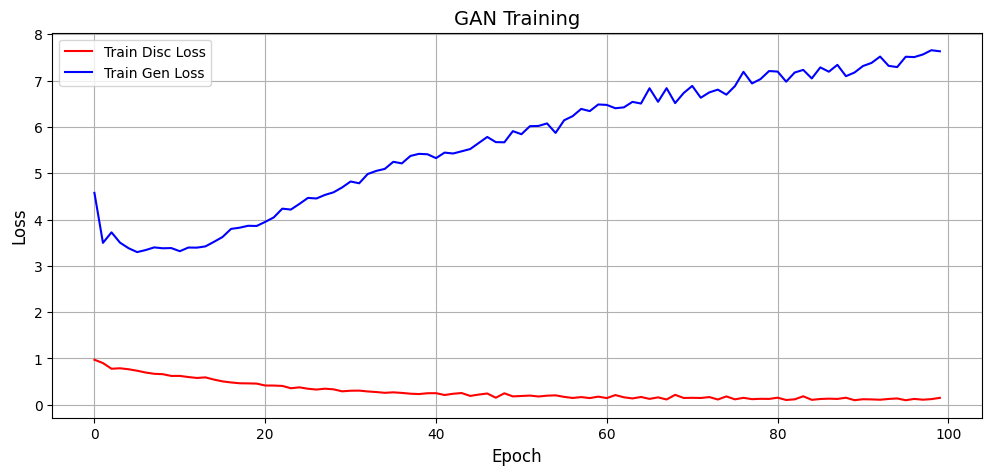

In [ ]:
import matplotlib.pyplot as plt

# --- Vẽ Loss ---
plt.figure(figsize=(12,5))
plt.plot(disc_loss, label="Train Disc Loss", color="red")
plt.plot(gen_loss, label="Train Gen Loss", color="blue")
plt.title("GAN Training", fontsize=14)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Đánh giá

- Tạo thư mục real data để làm chuẩn

In [ ]:
import numpy as np
import random
import tensorflow as tf

# ---- Set random seed 42 ----
seed = 42
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
import tensorflow as tf
import numpy as np

# ==== Load dataset ====
data = np.load("dataset.npz")
X_test   = data["X_test"]

In [ ]:
X_test.shape

(10000, 128, 128, 3)

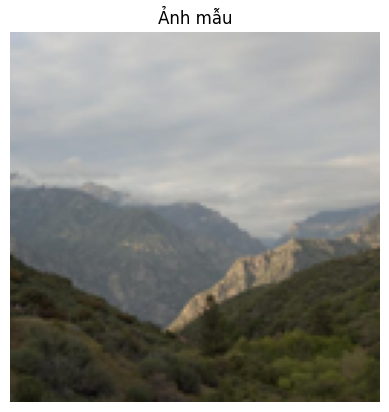

In [ ]:
import matplotlib.pyplot as plt
img = (X_test[100]+1)/2
plt.imshow(img)
plt.axis("off")
plt.title("Ảnh mẫu")
plt.show()


In [ ]:
import os
def save_real_images_individual(X_test, img_dir, num_images=10000):
    os.makedirs(img_dir, exist_ok=True)

    idx = np.random.choice(len(X_test), num_images, replace=False)
    real_images = X_test[idx]

    for i, img in enumerate(real_images):
        plt.imsave(os.path.join(img_dir, f"real_{i}.png"), img)

    print(f"✅ Đã lưu {num_images} ảnh vào thư mục: {img_dir}")


In [ ]:
save_real_images_individual((X_test+1)/2, "real_images_individual", num_images=10000)

✅ Đã lưu 10000 ảnh vào thư mục: real_images_individual


- Tạo các thư mục ảnh sinh

In [ ]:
fixed_noise = tf.random.normal([10000, latent_dim]) # tạo 10000 noise

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from tqdm import tqdm
import os
import tensorflow as tf
import matplotlib.pyplot as plt

def save_images_gen(generator, noise_batch, img_dir, target_shape=(128,128,3), batch_size=64):
    os.makedirs(img_dir, exist_ok=True)
    N = noise_batch.shape[0]

    for start in tqdm(range(0, N, batch_size), desc="Saving generated images"):
        end = min(start + batch_size, N)
        batch_noise = noise_batch[start:end]
        fake_images = (generator.model(batch_noise, training=False).numpy() + 1)/2

        if target_shape is not None:
            H, W, C = target_shape
            fake_images = tf.image.resize(fake_images, (H, W)).numpy()
            fake_images = fake_images[..., :C]

        for i, img in enumerate(fake_images, start=start):
            plt.imsave(os.path.join(img_dir, f"GEN_{i}.png"), img)

    print(f"✅ Đã lưu ảnh Gen vào thư mục: {img_dir}")


In [ ]:
! dir Models

 Volume in drive C has no label.
 Volume Serial Number is 8218-C701

 Directory of C:\GAN\Models

09/16/2025  06:29 PM    <DIR>          .
09/16/2025  06:29 PM    <DIR>          ..
09/16/2025  06:30 PM    <DIR>          .ipynb_checkpoints
09/16/2025  11:24 AM        44,716,496 discriminator_model_1.h5
09/16/2025  12:03 PM        44,716,496 discriminator_model_10.h5
09/16/2025  06:25 PM        44,716,496 discriminator_model_100.h5
09/16/2025  12:45 PM        44,716,496 discriminator_model_20.h5
09/16/2025  01:28 PM        44,716,496 discriminator_model_30.h5
09/16/2025  02:10 PM        44,716,496 discriminator_model_40.h5
09/16/2025  02:52 PM        44,716,496 discriminator_model_50.h5
09/16/2025  03:34 PM        44,716,496 discriminator_model_60.h5
09/16/2025  04:17 PM        44,716,496 discriminator_model_70.h5
09/16/2025  04:59 PM        44,716,496 discriminator_model_80.h5
09/16/2025  05:42 PM        44,716,496 discriminator_model_90.h5
09/16/2025  11:24 AM           926,432 generat

In [ ]:
model_gen = GEN()
model_gen.build_model()

In [ ]:
os.makedirs("generated_images_epoch", exist_ok=True)

In [ ]:
model_gen.load_model('generator_model.h5')
save_images_gen(model_gen,fixed_noise,f"generated_images_epoch")

Weights loaded from generator_model.h5


Saving generated images: 100%|███████| 157/157 [01:05<00:00,  2.41it/s]

✅ Đã lưu ảnh Gen vào thư mục: generated_images_epoch


In [ ]:
img_dir = "generated_images_epoch"
all_imgs = os.listdir(img_dir)

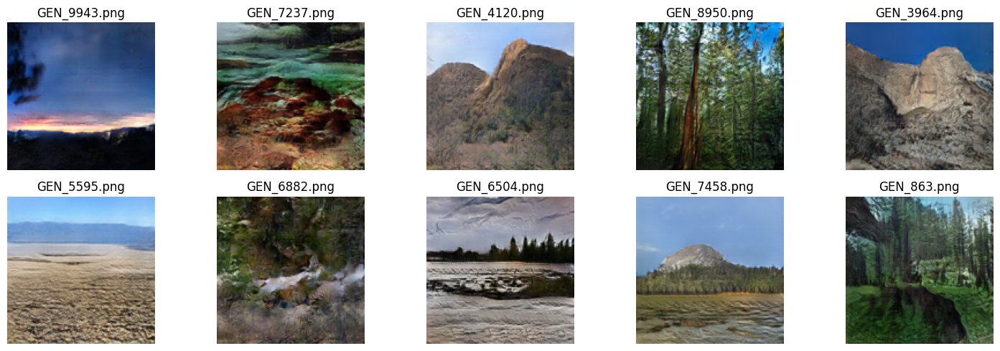

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Chọn ngẫu nhiên 10 ảnh
sample_imgs = random.sample(all_imgs, min(10, len(all_imgs)))

plt.figure(figsize=(15, 5))
for i, img_name in enumerate(sample_imgs):
    img_path = os.path.join(img_dir, img_name)
    img = mpimg.imread(img_path)

    plt.subplot(2, 5, i+1)  # 2 hàng x 5 cột
    plt.imshow(img)
    plt.axis('off')
    plt.title(img_name)

plt.tight_layout()
plt.show()

- FID

In [2]:
! pip install torch-fidelity

In [3]:
import torch

# Kiểm tra CUDA version
print("PyTorch CUDA version:", torch.version.cuda)

# Kiểm tra GPU có được nhận không
print("CUDA available:", torch.cuda.is_available())

# Nếu có GPU, in tên GPU
if torch.cuda.is_available():
    print("GPU name:", torch.cuda.get_device_name(0))
    print("GPU count:", torch.cuda.device_count())

PyTorch CUDA version: 12.6
CUDA available: True
GPU name: Tesla T4
GPU count: 1


In [5]:
! ls drive/MyDrive/GAN

discriminator_model.h5	generator_model.h5  Images
GAN.ipynb		history		    Models
generated_images_epoch	history.npz	    real_images_individual


In [6]:
real_dir = "drive/MyDrive/GAN/real_images_individual"

In [7]:
# import fidelity
import os
import re
base_dir = "drive/MyDrive/GAN/generated_images_epoch"

In [18]:
import torch_fidelity
results = []

print(f"🔍 Đang tính FID/KID  ...")
metrics_dict = torch_fidelity.calculate_metrics(
    input1=real_dir,
    input2=base_dir,
    fid=True,
    kid=True,
    batch_size=32,
    kid_subset_size=2000,
    verbose=True
    )

fid = metrics_dict["frechet_inception_distance"]
kid_mean = metrics_dict["kernel_inception_distance_mean"]
kid_std = metrics_dict["kernel_inception_distance_std"]

results.append((fid, kid_mean, kid_std))
print(f" FID={fid:.4f}, KID={kid_mean:.4f} ± {kid_std:.4f}")

🔍 Đang tính FID/KID  ...


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting features from input1
Looking for samples non-recursivelty in "drive/MyDrive/GAN/real_images_individual" with extensions png,jpg,jpeg
Found 10000 samples
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Processing samples
Extracting features from input2
Looking for samples non-recursivelty in "drive/MyDrive/GAN/generated_images_epoch" with extensions png,jpg,jpeg
Found 10000 samples
Processing samples
Frechet Inception Distance: 30.107967927336716
                                                            

 FID=30.1080, KID=0.0145 ± 0.0004


Kernel Inception Distance: 0.014499893188476562 ± 0.0003798779475701112


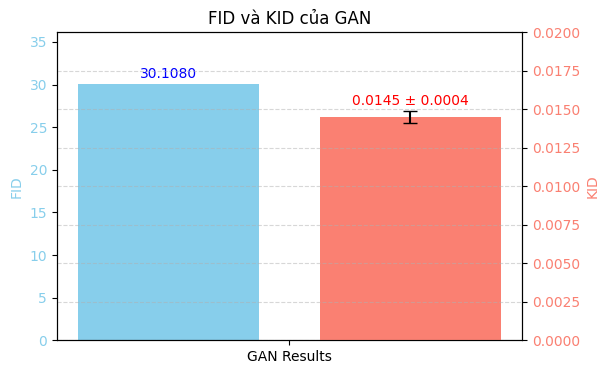

In [40]:
import matplotlib.pyplot as plt

fid, kid_mean, kid_std = results[0]

fig, ax1 = plt.subplots(figsize=(6,4))

x = 0
offset = 0.2

bar1 = ax1.bar(x - offset, fid, 0.3, color='skyblue', label="FID")
ax1.set_ylabel("FID", color="skyblue")
ax1.set_ylim(0, fid*1.2)
ax1.tick_params(axis='y', labelcolor="skyblue")
ax1.text(x - offset, fid*1.01, f"{fid:.4f}", ha='center', va='bottom', fontsize=10, color="blue")

ax2 = ax1.twinx()
bar2 = ax2.bar(x + offset, kid_mean, 0.3, yerr=kid_std, capsize=5, color='salmon', label="KID")
ax2.set_ylabel("KID", color="salmon")
ax2.set_ylim(0, 0.02)
ax2.tick_params(axis='y', labelcolor="salmon")
ax2.text(x + offset, kid_mean + kid_std*1.5, f"{kid_mean:.4f} ± {kid_std:.4f}",
         ha='center', va='bottom', fontsize=10, color="red")

ax1.set_xticks([x])
ax1.set_xticklabels(["GAN Results"])

plt.title("FID và KID của GAN")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


# Sinh

In [14]:
! ls drive/MyDrive/GAN

discriminator_model.h5	generator_model.h5  Images
GAN.ipynb		history		    Models
generated_images_epoch	history.npz	    real_images_individual


In [12]:
model_gen = GEN()
model_gen.build_model()

In [15]:
model_gen.load_model("drive/MyDrive/GAN/generator_model.h5")

Weights loaded from drive/MyDrive/GAN/generator_model.h5


In [16]:
import matplotlib.pyplot as plt
import tensorflow as tf

def show_images_gen(generator, noise_batch, target_shape=(128,128,3), ncols=8):
    # Sinh ảnh từ generator
    fake_images = (generator.model(noise_batch, training=False).numpy() + 1) / 2
    if target_shape is not None:
        H, W, C = target_shape
        fake_images = tf.image.resize(fake_images, (H, W)).numpy()
        fake_images = fake_images[..., :C]

    # Vẽ grid ảnh
    n_images = fake_images.shape[0]
    nrows = (n_images + ncols - 1) // ncols  # tính số hàng
    plt.figure(figsize=(ncols*2, nrows*2))
    for i, img in enumerate(fake_images):
        plt.subplot(nrows, ncols, i+1)
        plt.imshow(img)
        plt.axis("off")

    plt.suptitle(f"Generated Images", fontsize=16)
    plt.tight_layout()
    plt.show()

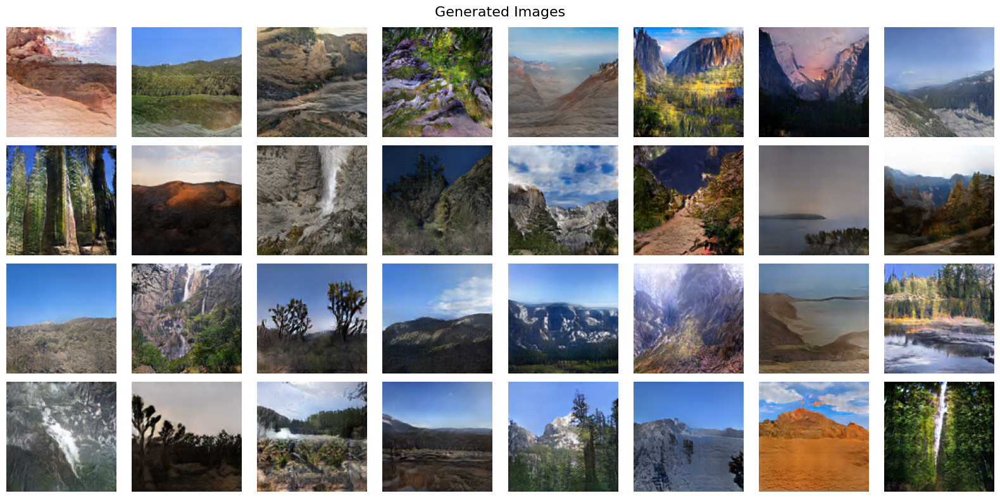

In [17]:
fixed_noise = tf.random.normal([32, latent_dim])
show_images_gen(model_gen, noise_batch=fixed_noise)

# Tạo demo

In [41]:
import gradio as gr
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
model_gen = GEN()
model_gen.build_model()
model_gen.load_model("drive/MyDrive/GAN/generator_model.h5")

In [45]:
img_shape = (128, 128, 3)
latent_dim = 128

In [50]:
def generate_images(n_images=16, ncols=4):
    noise = tf.random.normal([n_images, latent_dim])

    fake_images = (model_gen.model(noise, training=False).numpy() + 1) / 2
    fake_images = tf.image.resize(fake_images, (128, 128)).numpy()

    images = []
    for i in range(n_images):
        img = (fake_images[i] * 255).astype("uint8")
        images.append(img)

    return images

In [54]:
demo = gr.Interface(
    fn=generate_images,
    inputs=[
        gr.Slider(4, 64, value=16, step=4, label="Số ảnh muốn sinh"),
        gr.Slider(2, 10, value=4, step=1, label="Số cột (grid)")
    ],
    outputs=gr.Gallery(
        label="Ảnh sinh từ GAN",
        show_label=True,
        columns=4,
        rows=None,
        object_fit="contain",
        height="auto"
    ),
    title="GAN Image Generator",
    description="Sinh ảnh từ generator_model.h5 bằng Gradio",
    allow_flagging="never"
)


/usr/local/lib/python3.12/dist-packages/gradio/interface.py:414: UserWarning: The `allow_flagging` parameter in `Interface` is deprecated. Use `flagging_mode` instead.
  warnings.warn(


In [55]:

demo.launch(debug=True)

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://88d2d1ff0354712bdb.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://88d2d1ff0354712bdb.gradio.live
